In [1]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline

import re
import os
import os.path
import glob
from PIL import Image
from skimage import io

from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils

from keras.models import Sequential,Model
from keras.layers import Input,Flatten,Dense,Dropout,GlobalAveragePooling2D,Conv2D,MaxPooling2D
from keras.preprocessing.image import img_to_array
from keras.preprocessing import image
from vis.utils import utils
from keras.applications import VGG16
from vis.visualization import visualize_cam,visualize_saliency, overlay

# Disable GPU
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

Using TensorFlow backend.


In [2]:
imagedir = "Datasets/malimg_paper_dataset_imgs"

In [3]:
cur_dir = os.getcwd()
os.chdir(imagedir)  # the parent folder with sub-folders

# Get number of samples per family
list_fams = sorted(os.listdir(os.getcwd()), key=str.lower)  # vector of strings with family names
no_imgs = []  # No. of samples per family
for i in range(len(list_fams)):
    os.chdir(list_fams[i])
    len1 = len(glob.glob('*.png'))  # assuming the images are stored as 'png'
    no_imgs.append(len1)
    os.chdir('..')
num_samples = np.sum(no_imgs)  # total number of all samples

# Compute the labels
y = np.zeros(num_samples)
pos = 0
label = 0
for i in no_imgs:
    print ("Label:%2d\tFamily: %15s\tNumber of images: %d" % (label, list_fams[label], i))
    for j in range(i):
        y[pos] = label
        pos += 1
    label += 1
num_classes = label

# Compute the features
width, height,channels = (224,224,3)
X = np.zeros((num_samples, width, height, channels))
cnt = 0
list_paths = [] # List of image paths
print("Processing images ...")
for i in range(len(list_fams)):
    for img_file in image.list_pictures(list_fams[i], ext='jpg|jpeg|bmp|png'):
        #print("[%d] Processing image: %s" % (cnt, img_file))
        list_paths.append(os.path.join(os.getcwd(),img_file))
        img = image.load_img(img_file, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        X[cnt] = x
        #x /= 255
        #x = preprocess_input(x)
        #X[cnt] = np.array(x).reshape(width*height*channels)
        cnt += 1
print("Images processed: %d" %(cnt))

os.chdir(cur_dir)

Label: 0	Family:       Adialer.C	Number of images: 122
Label: 1	Family:       Agent.FYI	Number of images: 116
Label: 2	Family:       Allaple.A	Number of images: 2949
Label: 3	Family:       Allaple.L	Number of images: 1591
Label: 4	Family:   Alueron.gen!J	Number of images: 198
Label: 5	Family:       Autorun.K	Number of images: 106
Label: 6	Family:     C2LOP.gen!g	Number of images: 200
Label: 7	Family:         C2LOP.P	Number of images: 146
Label: 8	Family:  Dialplatform.B	Number of images: 177
Label: 9	Family:       Dontovo.A	Number of images: 162
Label:10	Family:        Fakerean	Number of images: 381
Label:11	Family:   Instantaccess	Number of images: 431
Label:12	Family:      Lolyda.AA1	Number of images: 213
Label:13	Family:      Lolyda.AA2	Number of images: 184
Label:14	Family:      Lolyda.AA3	Number of images: 123
Label:15	Family:       Lolyda.AT	Number of images: 159
Label:16	Family:     Malex.gen!J	Number of images: 136
Label:17	Family:   Obfuscator.AD	Number of images: 142
Label:18

In [4]:
# Encoding classes (y) into integers (y_encoded) and then generating one-hot-encoding (Y)
encoder = LabelEncoder()
encoder.fit(y)
y_encoded = encoder.transform(y)
Y = np_utils.to_categorical(y_encoded)

In [5]:
# Creating base model (VGG16 convolutional layers)
img_shape = (224, 224, 3)                                                                                                                                               
model = Sequential()

# Block 1
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', input_shape=img_shape))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool'))

# Block 2
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool'))

# Block 3
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool'))

# Block 4
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool'))

# Block 5
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool'))

In [6]:
vgg16weights = "vgg16_weights_tf_dim_ordering_tf_kernels.h5"
model.load_weights(vgg16weights, by_name=True)

In [7]:
# Stacking top model (fc and softmax layers)
model.add(Flatten())                                                
model.add(Dense(160, activation='relu', name='fc1'))
model.add(Dropout(0.4))                
model.add(Dense(160, activation='relu', name='fc2'))
model.add(Dropout(0.4))              
model.add(Dense(num_classes, activation='softmax', name='predictions'))                             

In [8]:
top_weigths = "top_model-weights-max_val_acc-mlp-vgg16-2layers-160neurons-relu-0.4dropout-Adam-500epochs.h5"
model.load_weights(top_weigths, by_name=True)

In [9]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
# The name of the layer we want to visualize
layer_name = 'predictions'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]

Family: Adialer.C
Image: ['0777838385f25867f61ee43ab89c8704.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['07d083e3ec309e9268e693552ca9839c.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['01691141ed365252bbe290bb7841c0c5.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['05de9c8ef05825c1d65958834500015d.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['03bf9abf840c7ebd87126f1f99a30ba6.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)


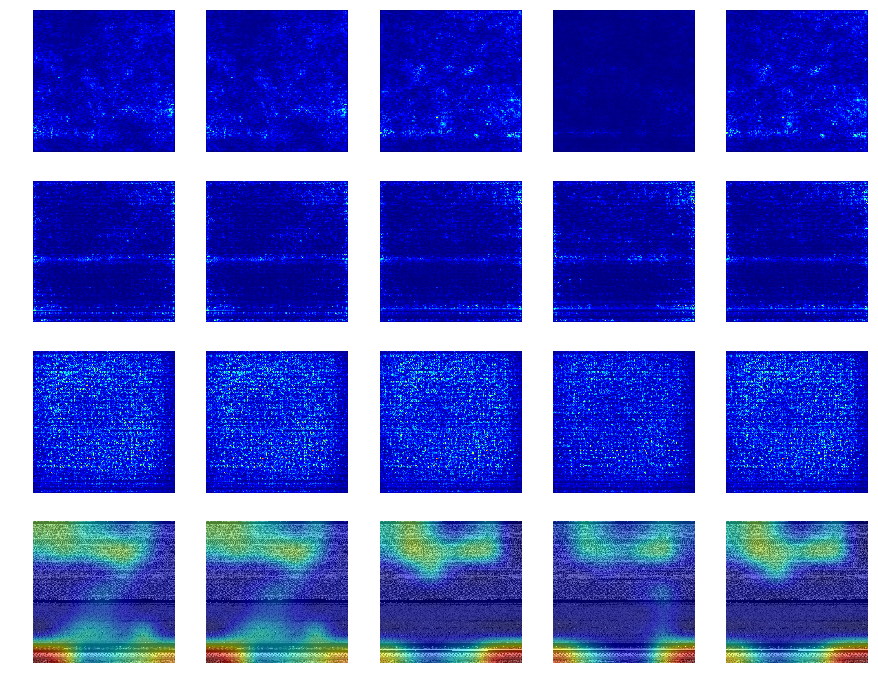

Family: Agent.FYI
Image: ['00d757d6e25c1e0cf6278cc3bbedb2e4.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['088c0581b722d2b2c25a61f21a19669c.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['08040557c801fa10090b88b0ec495dd0.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['04814e5b6598cd20307630b1b91b6854.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['07e549eae0812fc67eac21204b0bf60a.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)


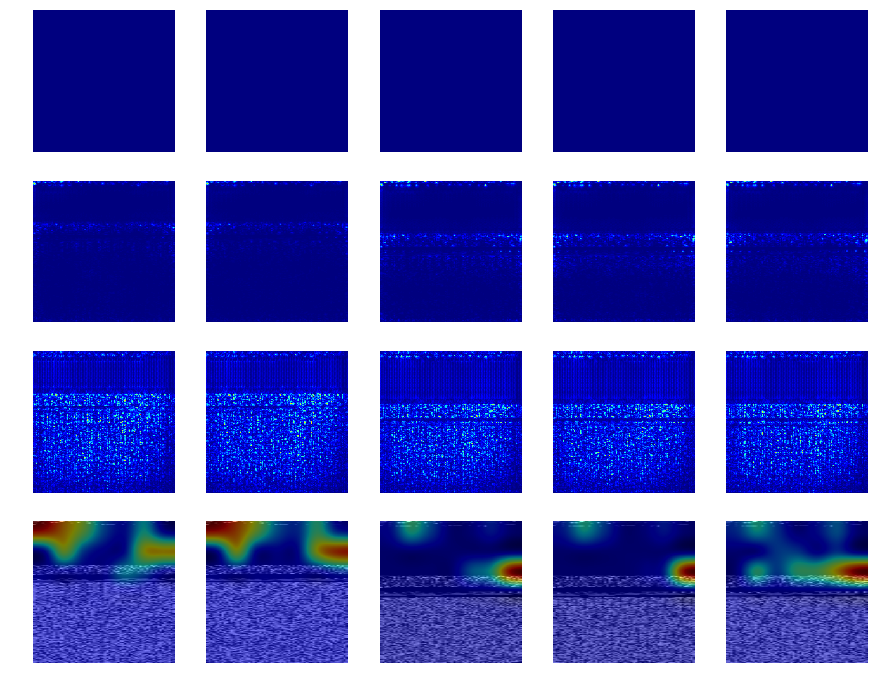

Family: Allaple.A
Image: ['06b954ba2ef891fb5f2d8077fb2aa6c4.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['04883c6fa785ba6fdc4436fd5740d42c.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['05a3d927598223fb5e2ec3b68a7ed98a.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['039b27bbdd8d4e2990e34a05f9db41c5.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['05618ecb39dae501f53763df25ce697e.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)


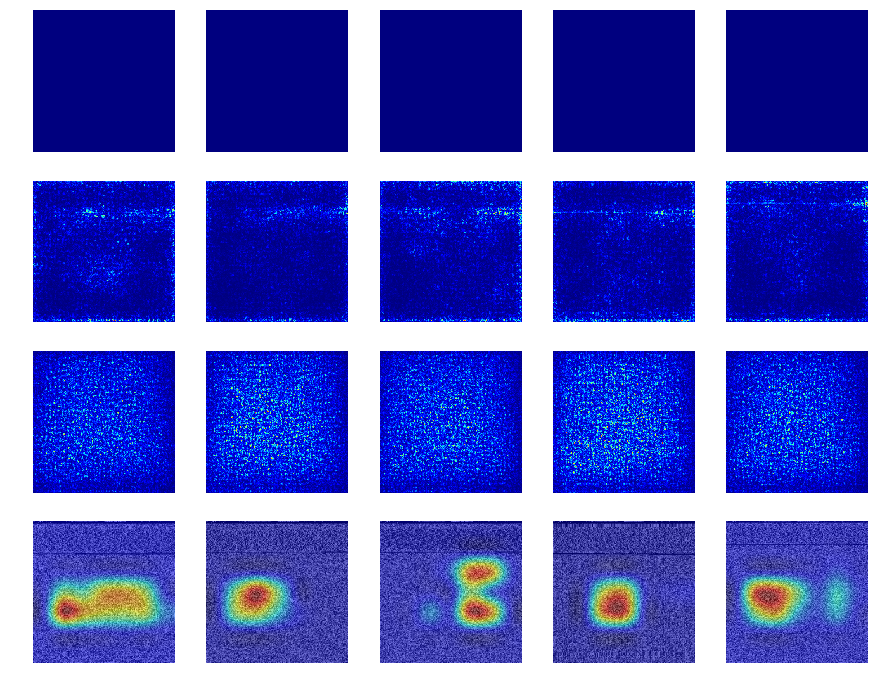

Family: Allaple.L
Image: ['01cdc112e7ae462ed47568ea8171669d.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['00cb5c7d76cbadf1e3d9b80c834218b2.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['0790ca7dc3c49edd00e570ab4157679c.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['05030ea93133f1045650b7f53a5f5b0b.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['04c2529c6c24278d39454e4f1035a376.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)


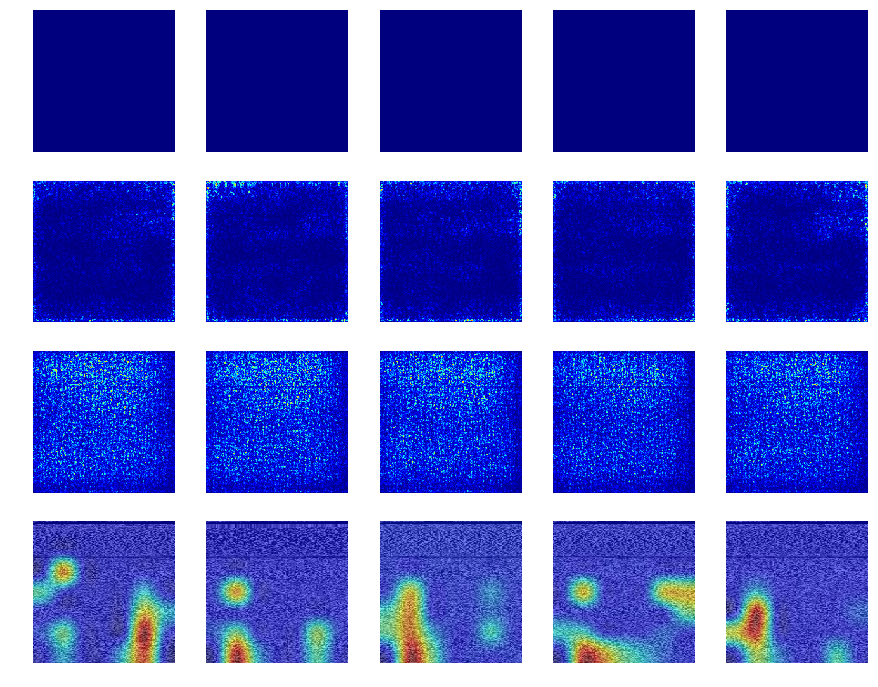

Family: Alueron.gen!J
Image: ['066becf2e6e5bd99737fd5d36330c986.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['089de27019e5b00e0f87827adc88f170.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['00f2248f605ef505893e21d2096c7e4e.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['001eeaa5593a996d45c187c91c9d3026.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['00f07af82e59f9824f77c03e6c204de5.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)


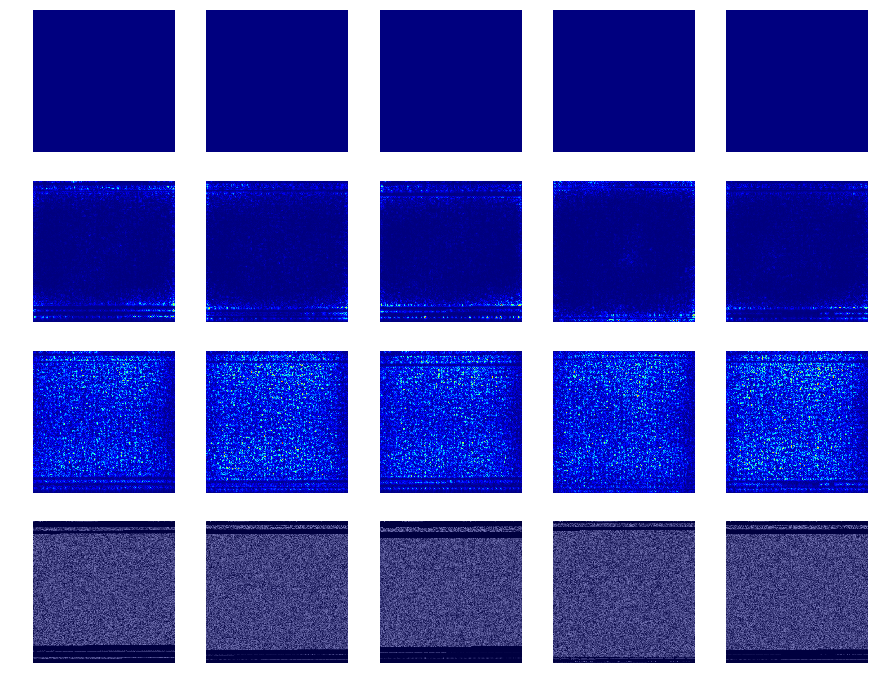

Family: Autorun.K
Image: ['0516a02eaca930cdf6fa22ea705ae246.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['03bb296bfdbcfae2329b4b3bd57b411e.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['03a93c8cd407bcf3a2b66714ea22e6d6.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['052c7c63f5a325d693f50eec49b14fb6.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['04b38a454c19af44b3bb416d47151e41.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)


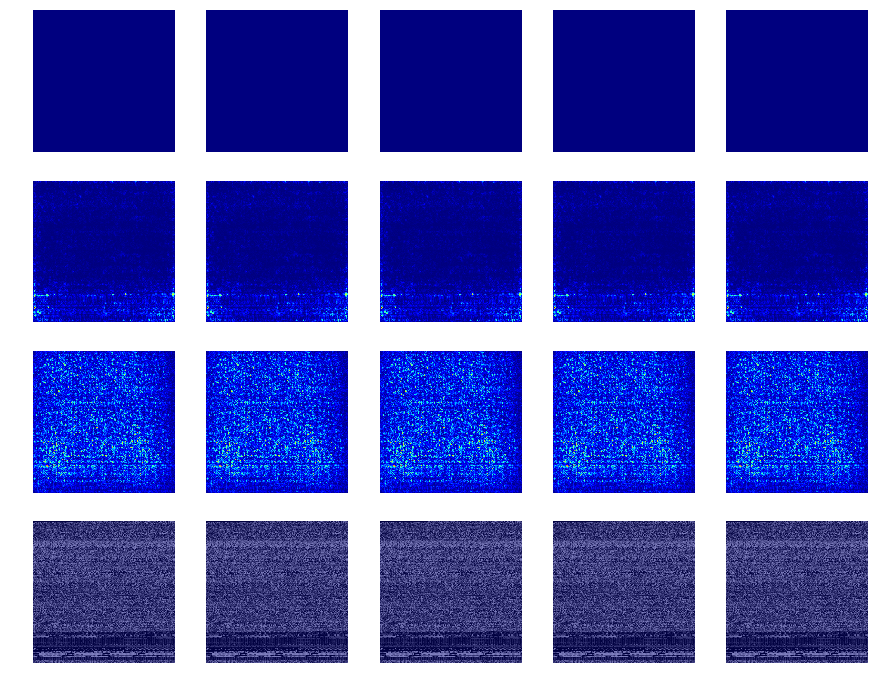

Family: C2LOP.gen!g
Image: ['0025ce5f90bf63edd9edf195c69a2d8c.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['020319b523015d284969a303ec57dc48.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['05862d739564aa012bab2c01298af674.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['08a068bdde888ab924fc4673f7393917.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['02123bdb1fc17676f794ccc15f72a627.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)


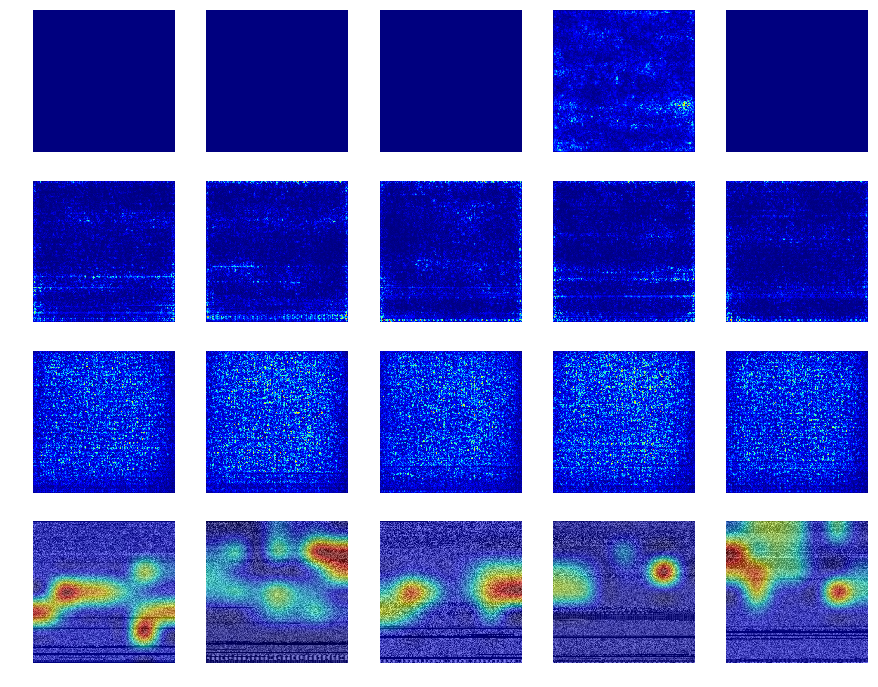

Family: C2LOP.P
Image: ['056c4554e05417327091eda7bbe7cbc3.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['0435a1477cedf4be81d63f98a07f26a1.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['005b615999cb5fae2afa0411ecc266ad.png'] - Class: ['C2LOP.P'] - Pred: 6 (C2LOP.gen!g)
Image: ['060f9341ac550f510a7bd9c85ad17cab.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['06d5bbb74c304ee364479ae888beda15.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)


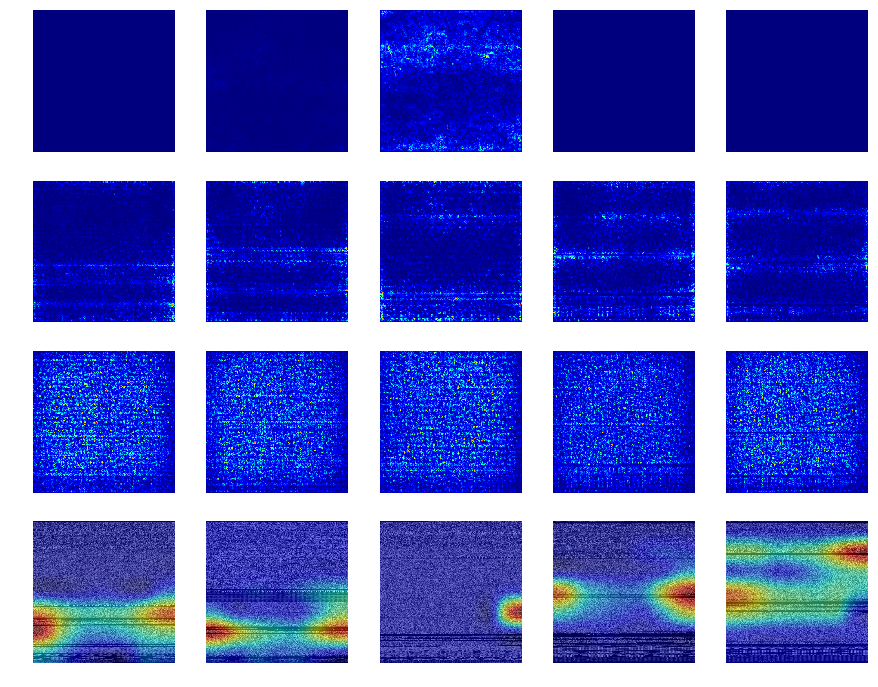

Family: Dialplatform.B
Image: ['00455be2b5e7a3e97295b4886649b623.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['0887f5b6fad64cca2be1106858c4fa94.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['0742301728d8344bd8c554114eadd99c.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['06e88c1d23ecc51b5896b78b3c2b7b79.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['07e423afaa57af29c5a1d45cedca8b86.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)


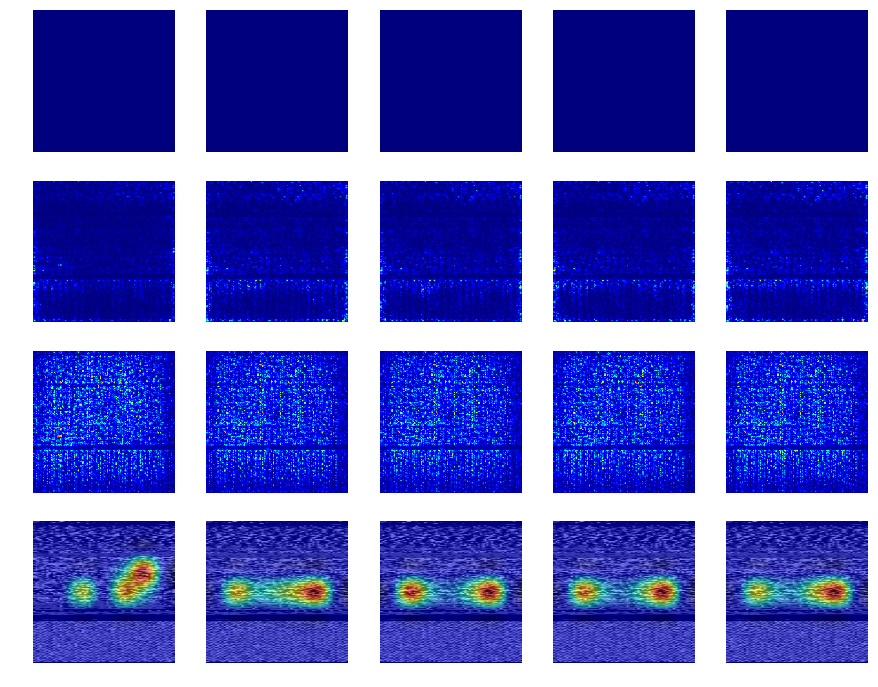

Family: Dontovo.A
Image: ['06dd6c9ffe2986d1c1f1706c20386028.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['00bfa27cb69608b8df2cab76c7be3bb6.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['00f89162aba550a6f44baf843a312891.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['07b430ae9d90e246ebcaec572f43c7e1.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['0116dce0fdb4aa7f4f9725817eac4d59.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)


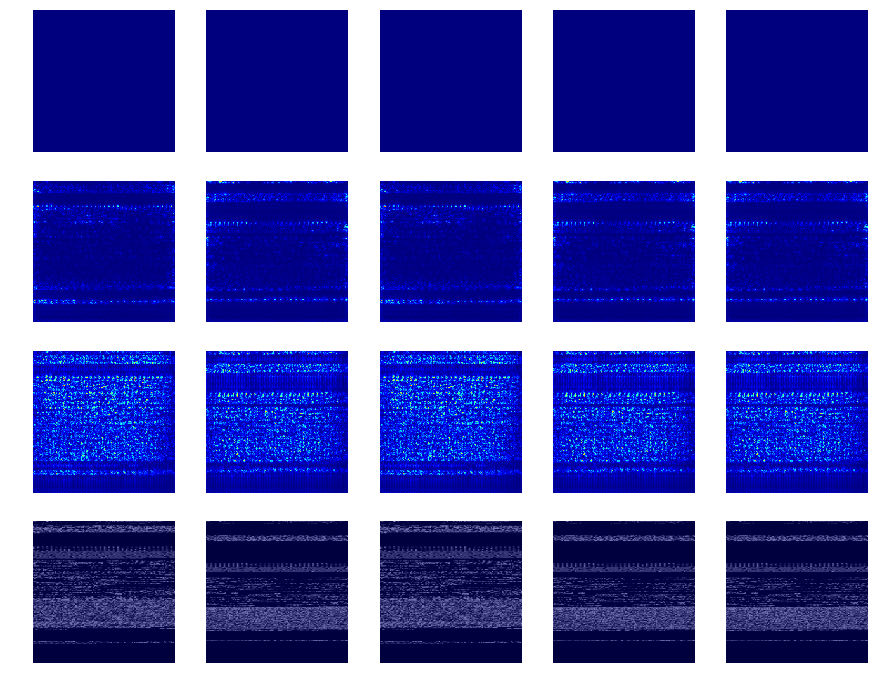

Family: Fakerean
Image: ['038b4594a0079366b9dfed39e48d7570.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['089ccf64b3318c108b79529a5651834d.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['00bca831fcfb8b3936348ae4fdb9a465.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['0766993398b7107e19f028aef6409efc.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['0077247f199fe042433d455fa196121d.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)


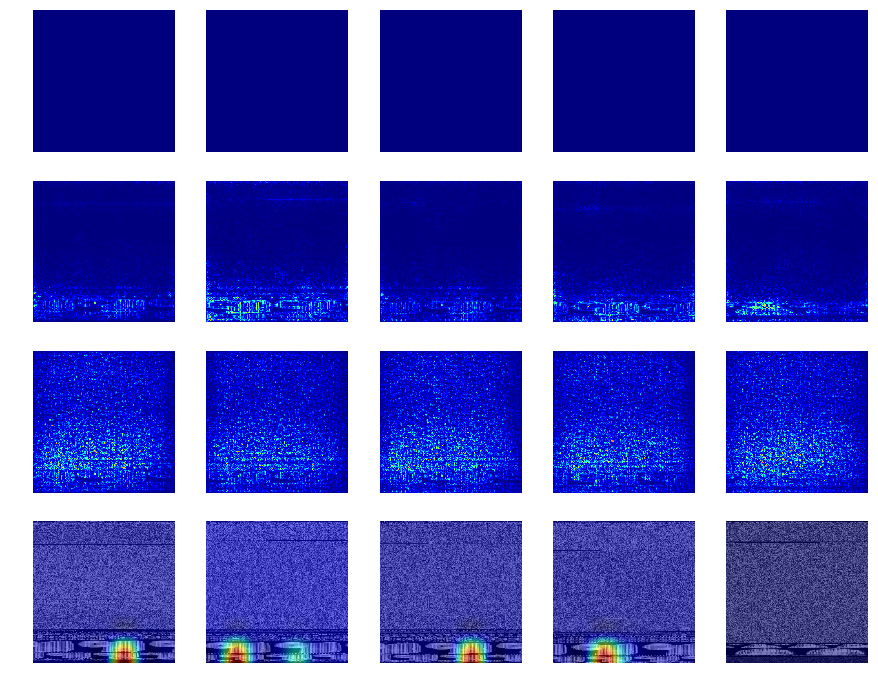

Family: Instantaccess
Image: ['047f8f356737b598998f49e2c808dcf7.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['08a95aa7522fc5dc980ba2a3759a7307.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['049f06ccbfcfbd030d5ef641ca16a2a8.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['01caceaeaa4b36833aaf0d9615d525fa.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['03615e33cb0119a60224c80393ccd9f2.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)


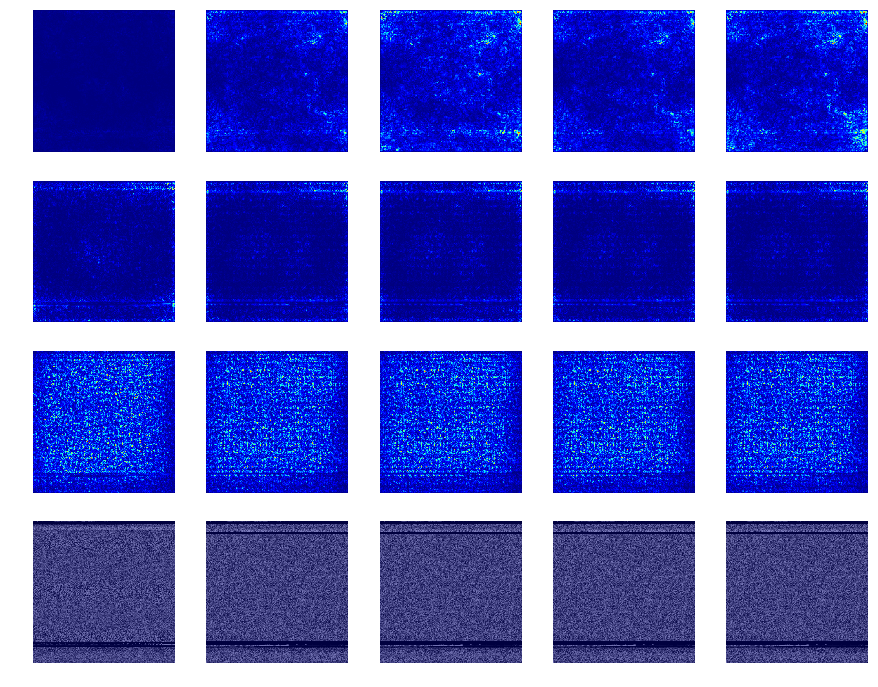

Family: Lolyda.AA1
Image: ['00b6b2c0971d4455ade732441c891557.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['004b987b2e23cbef54b7e7409445827e.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['00184133dec379c07e0892e174d0b3ee.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['00214fb94288c34da6aa54210e4cc177.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['009b5c84cd72a226742d6fdd4e748ce7.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)


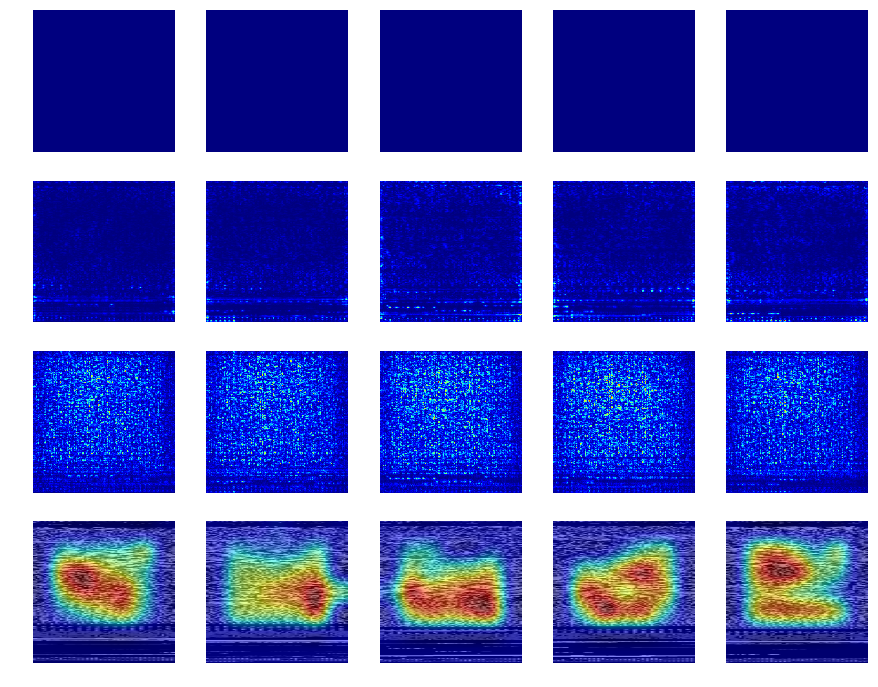

Family: Lolyda.AA2
Image: ['00a1038a6bbe321ba7e3538b2b972d31.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['0023cbc0d021d5a1c03aacc1aa2249f6.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['00181d599a8ef53032c66e258c22112c.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['003580aaf135dc61258992ed859ae31e.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['006e35aea0e2ab36347992e72b083e57.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)


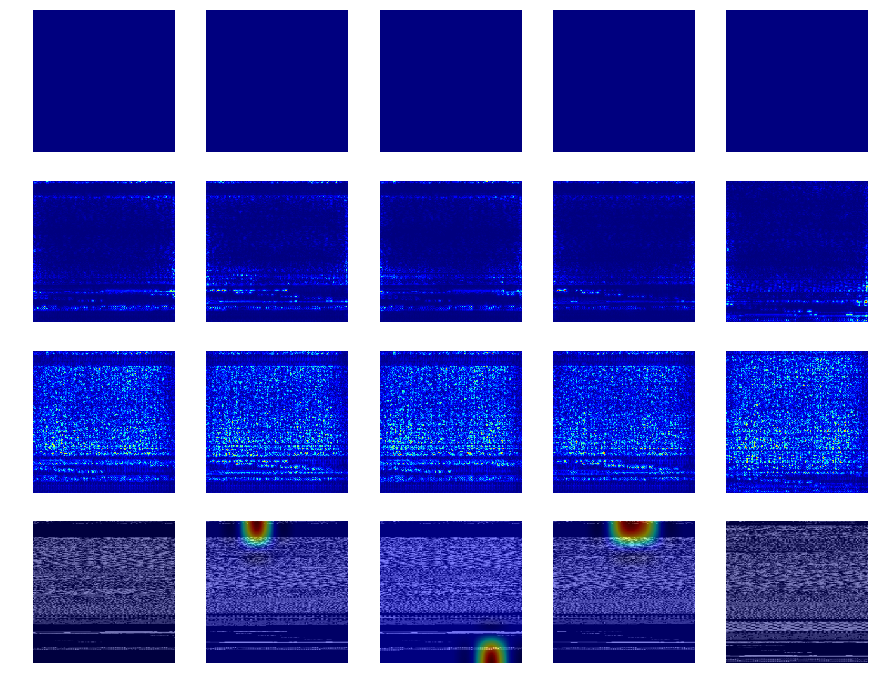

Family: Lolyda.AA3
Image: ['007a926e49efb5b943b49f874cf6479b.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['007618e8258e26e2d301db7f58271ff1.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['00cb9c74fca4562613aa88ebd0519bd1.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['00df69296381eb041ce6054d127a8c35.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['0044cd044df6d346da4811a6b03943ea.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)


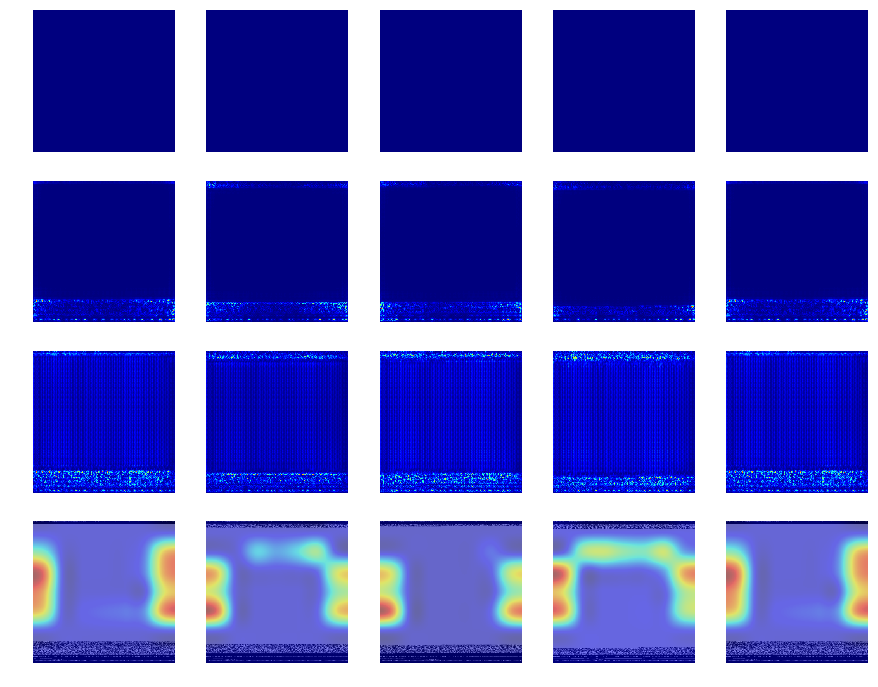

Family: Lolyda.AT
Image: ['03914ad1fc9408ae93c3eb9f1aec22c9.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['03ac99c9331a490c0720726240654ed3.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['014622bc3cfae5a7f2b6e5ee25c5f6b1.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['02808ede32d634b96d3c9cf84d5942b1.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['0205fafb998daf57ff5c3c39410ceb18.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)


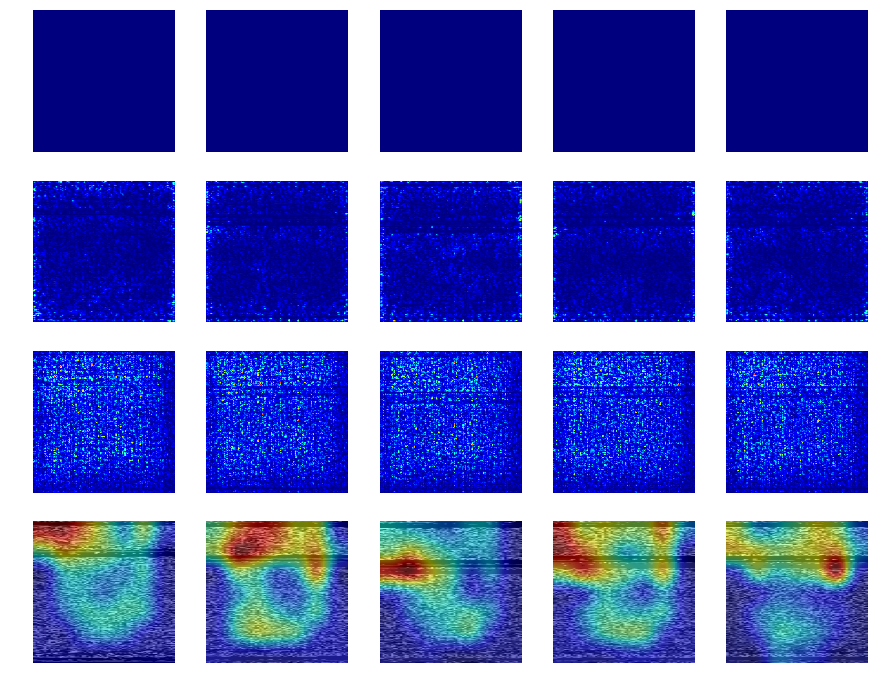

Family: Malex.gen!J
Image: ['05100a9fea69434590ee023cbbc89c79.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['044c19f955ae57b7fc1b1bc1ff29ec5b.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['0524a75e554232d1a28e1da77f546073.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['058390d17eabd1d8ef0323ebccd192d1.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['03011dfd5884d3a6de6a8e32818bc8f0.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)


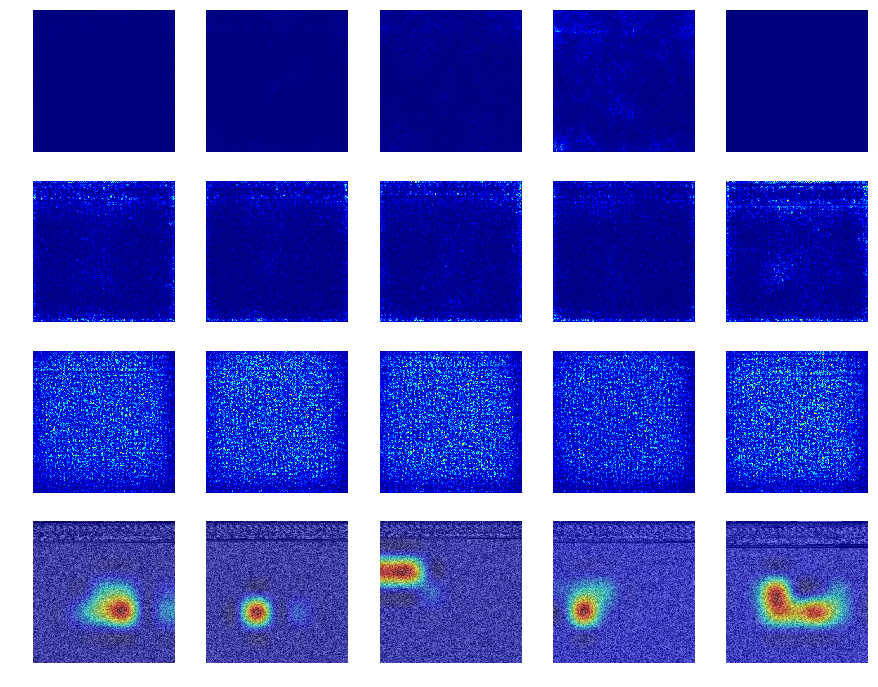

Family: Obfuscator.AD
Image: ['0348ae3011a4721d3d532ca1dd5d592f.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['043c2969f0068a83ed8070b58f4c2b0b.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['000a05c1d0ef03d9bb70fef29e91b395.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['07ddc3655031ed6f3369cce82c07a206.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['07e1f4d873519034c84d3bc2ca8947eb.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)


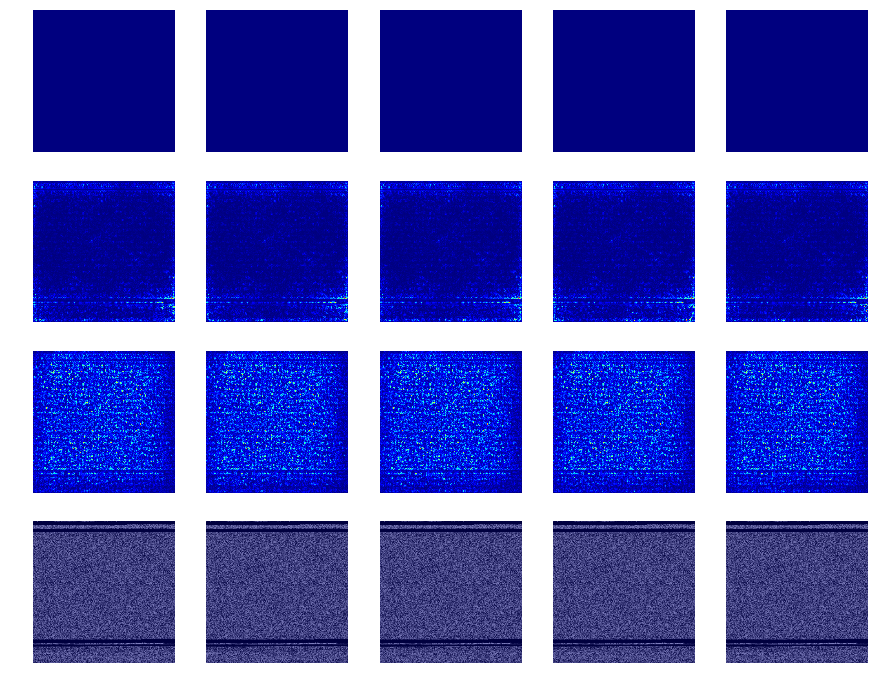

Family: Rbot!gen
Image: ['1b4b3e9b902988bab6598833b588761b.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['2561d2effe769aa9dfaa8840c0167698.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['90164946a88704ace0baae8587c578c0.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['8c1a2ab433d0d4ea50b5e3ada0d85d08.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['d7f96be8ee1a446c036a0cda548180ee.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)


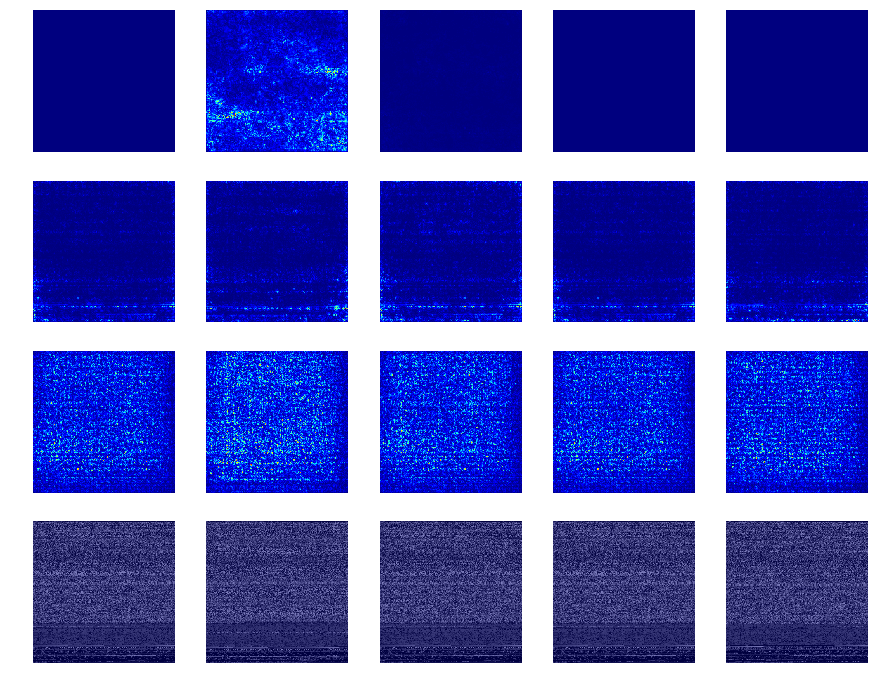

Family: Skintrim.N
Image: ['008ebd815a0c7948160a3066c8c5814a.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['006dca5b70a6f091fc33ac91dca37f6e.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['00846c5f2bc1400cc6d782d6857041d5.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['003970c6836945433b0791e21c343395.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['00e6beeeb33f5d287df7378d8634b949.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)


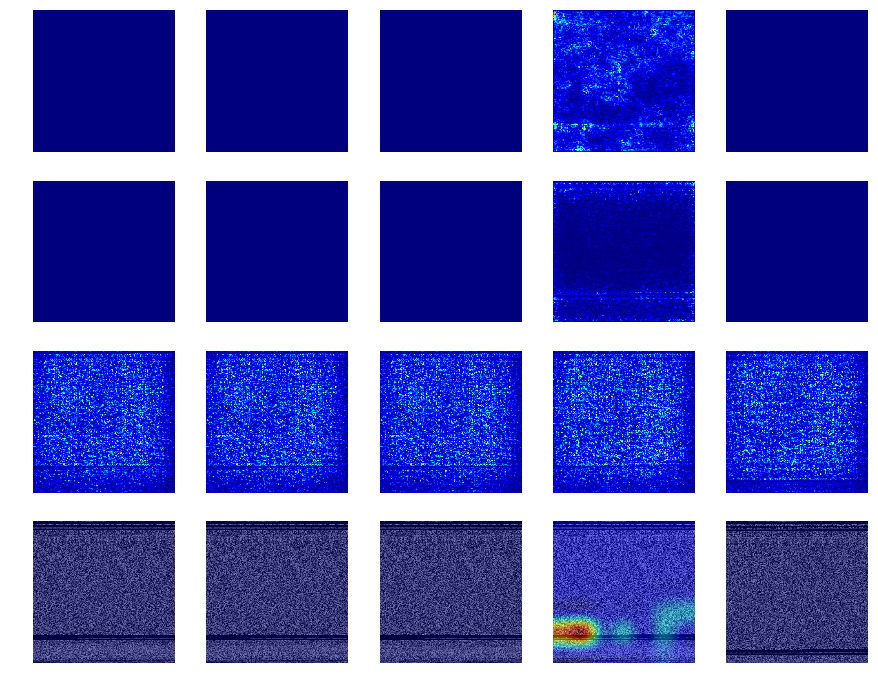

Family: Swizzor.gen!E
Image: ['00231bd15cd714c3604d0ab60c3f0ec3.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['04a9bedc2f641dc3059d40da1f9ef755.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['0668bae18d7436182980befac6809c28.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['0383e8acee3c668143ffef79038c71f7.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['04f1ed2e69da4ce242e7a5d667b35f2d.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)


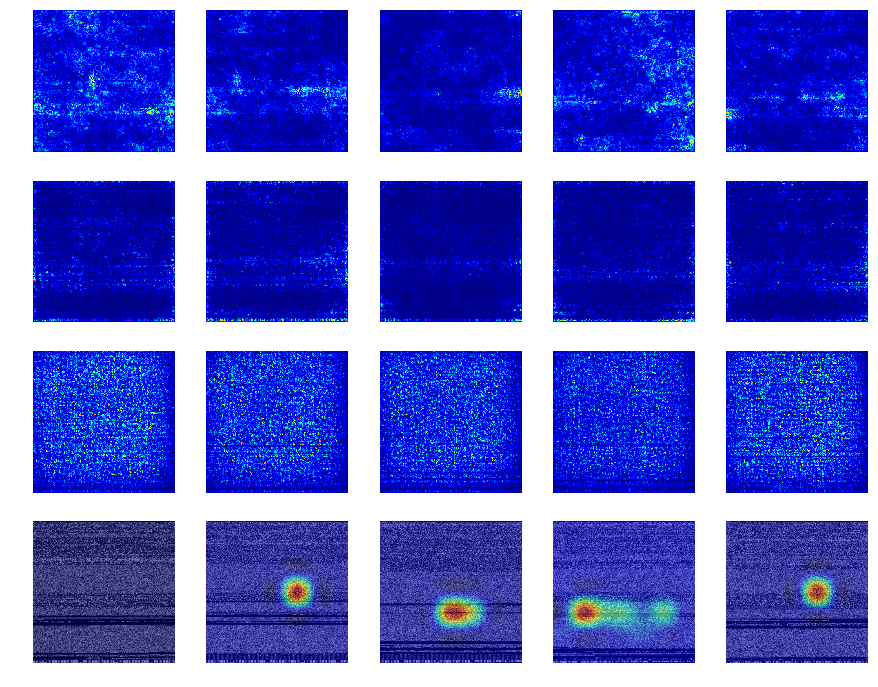

Family: Swizzor.gen!I
Image: ['04efad9c74f24e6001e078ccbbef344a.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['06527d6eeea115791c430488dc9ede05.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['064f6f3c14fb95ffce94e601b5177ce7.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['04b5b000035a9c0e5563633a97b313e1.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['002bf4a0e4a3da41f2400fd5094373b6.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)


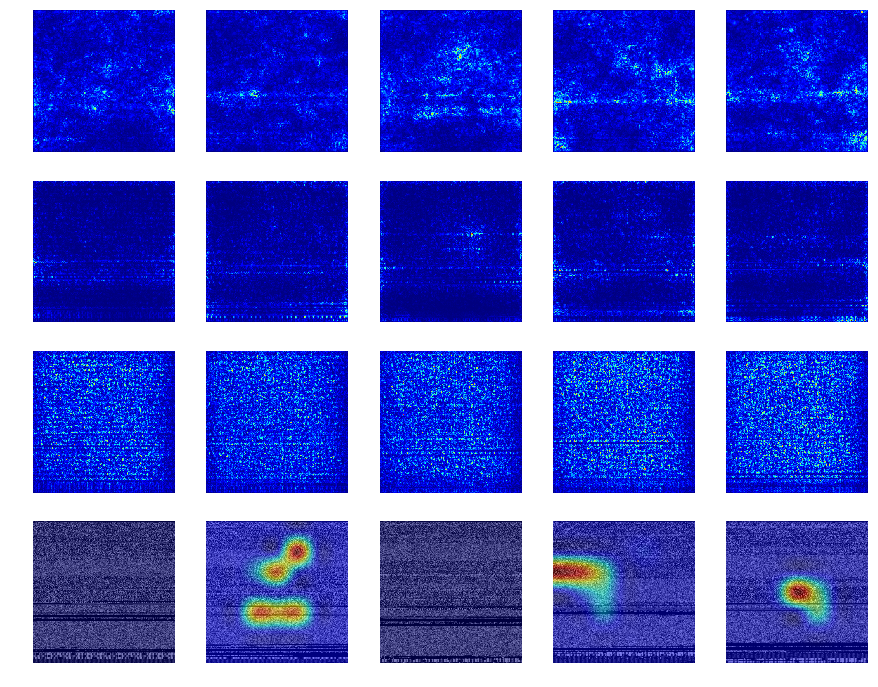

Family: VB.AT
Image: ['04e8f06ace3f0f9c66591ac8a5e912ed.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['034089d10ffb8fe6acea8fe8d0033fa2.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['06890153e6a8862a9985a9e9e2343092.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['00ff0955b5c177729436036ab966181b.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['01e98bcc0c3320ec8242d2d0362bafac.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)


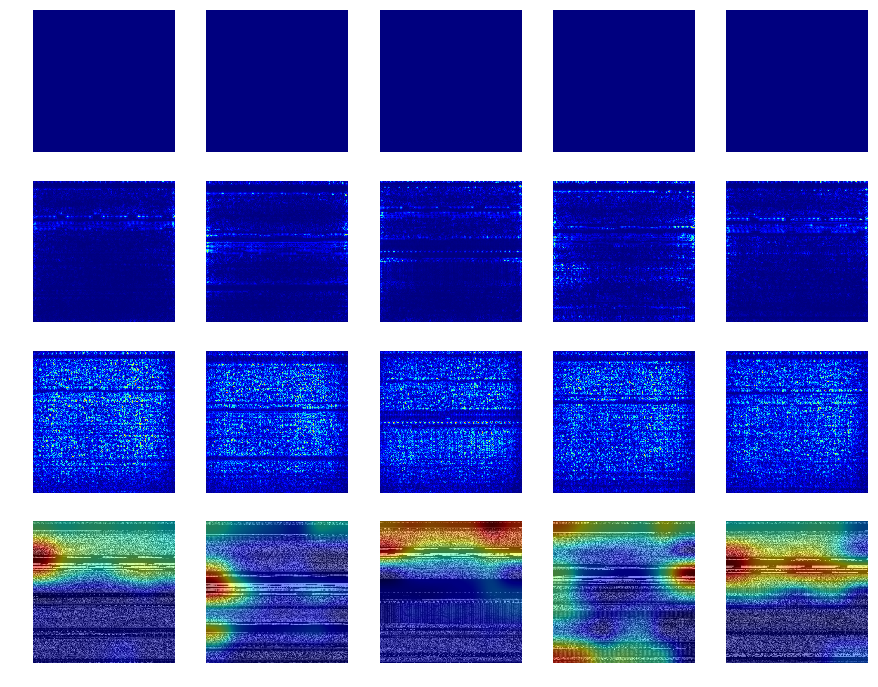

Family: Wintrim.BX
Image: ['008ce85369598dd5d72b07008ef2b5ca.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['00ab053d7acab54eed85fa68f0005bd3.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['009f7898918f440244d140d1bb9fcc45.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['0030212dd56077d1e694459db7f9a9a0.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['0019b63efcae8941420268f086f76350.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)


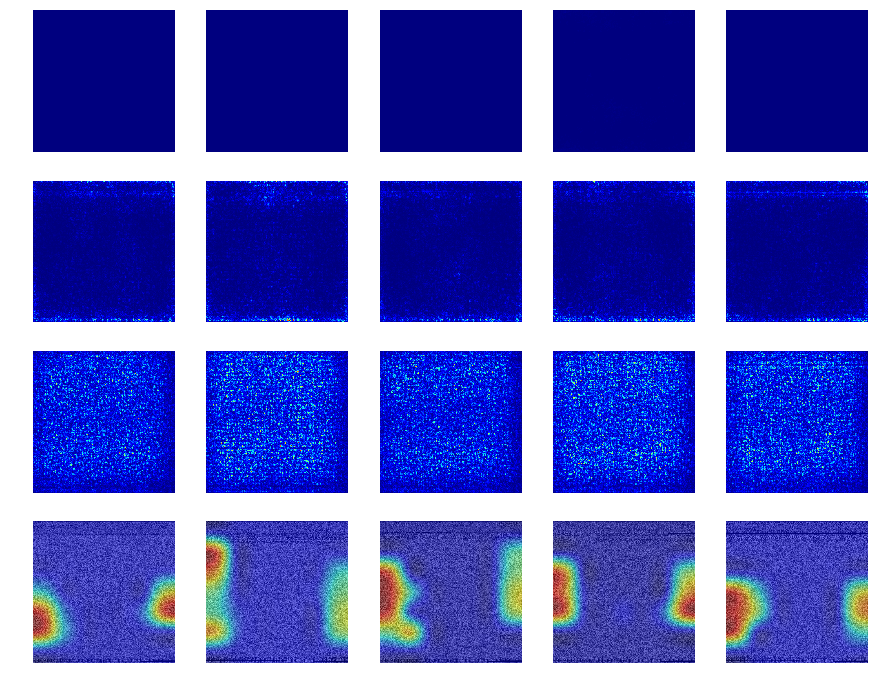

Family: Yuner.A
Image: ['0089c1c69992fc03a2d5bb2b96c4680e.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['04acc181d57dae2b6999116335dffbb8.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['007d1872ce5637287cf11ae9e30953f6.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['001dcd7215ee0691b4e2c1057da21c54.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['006102b88a8b6046aef3a91b77bc1439.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)


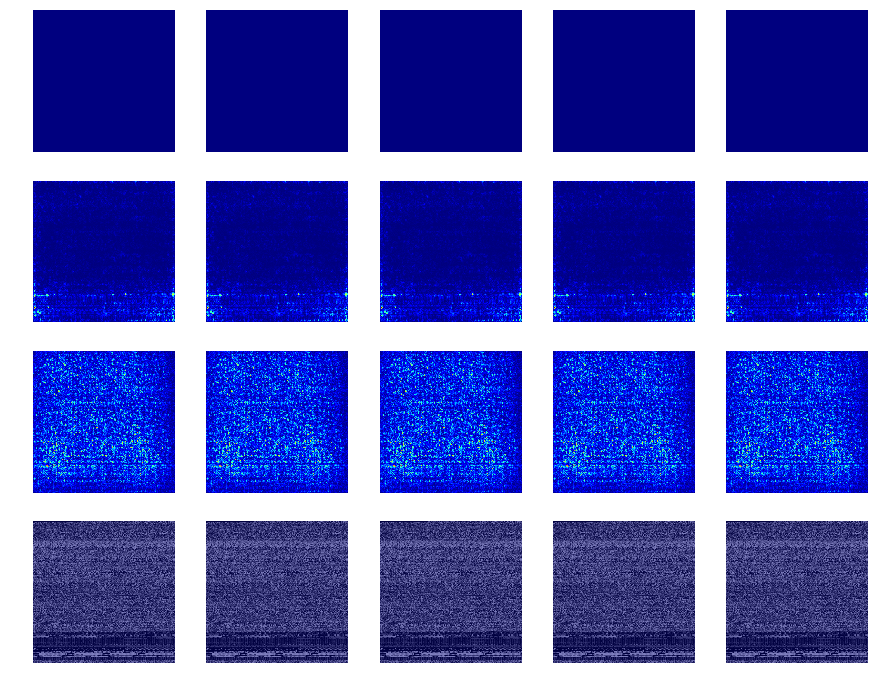

In [29]:
samplesbyfamily = 5 
for fam in list_fams:
    print("Family: %s" %(fam))
    fam_samples = [name for name in list_paths if fam in name]
    image_paths = random.sample(fam_samples, samplesbyfamily)
    
    #fig = plt.figure(figsize=(16, 8))
    f, ax = plt.subplots(4, samplesbyfamily)
    f.set_size_inches(15, 12)
    ind = 0
    
    for path in image_paths:
        # Predict the corresponding class for use in `visualize_cam`.
        img = io.imread(path)
        img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
        img = cv2.resize(img, (224, 224))
        pred_class = np.argmax(model.predict(np.array([img_to_array(img)])))
        print("Image: %s - Class: %s - Pred: %d (%s)" %(path.split('/')[-1:],path.split('/')[-2:-1],pred_class,list_fams[pred_class]))

        # Here we are asking it to show attention such that prob of `pred_class` is maximized.
        #heatmap = visualize_cam(model, layer_idx, [pred_class], seed_img, text=list_fams[pred_class])
        #heatmaps.append(heatmap)
        
        heatmap = visualize_cam(model, layer_idx, filter_indices=[pred_class], seed_input=img, backprop_modifier='guided')        
        grads = visualize_saliency(model, layer_idx, filter_indices=[pred_class], seed_input=img)
        gradsguided = visualize_saliency(model, layer_idx, filter_indices=[pred_class], seed_input=img, backprop_modifier='guided')
        gradsrelu = visualize_saliency(model, layer_idx, filter_indices=[pred_class], seed_input=img, backprop_modifier='relu')

        ax[0,ind].axis('off')
        ax[0,ind].imshow(grads, cmap='jet')
        ax[1,ind].axis('off')
        ax[1,ind].imshow(gradsguided, cmap='jet')
        ax[2,ind].axis('off')
        ax[2,ind].imshow(gradsrelu, cmap='jet')
        ax[3,ind].axis('off')
        ax[3,ind].imshow(overlay(heatmap, img))
        ind = ind + 1
        
    plt.show()    